### Preprocessing of predictions and determination of interface mutations

In [1]:
import pandas as pd
import matplotlib
import warnings
import os
import numpy as np
import seaborn as sns
from matplotlib import pyplot as plt
from matplotlib.patches import Patch
import analysis_utils
from copy import deepcopy

# path to repository folder (data is stored here as well)
path = '..'
preds_loc = os.path.join(path, 'data', 'analysis', 'q3421_analysis.csv')

# default plotting settings
font = {'size'   : 18}
matplotlib.rc('font', **font)

# notebook display options
warnings.filterwarnings('ignore')
pd.options.display.max_rows = 300

# load dictionaries to improve formatting of model names
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

# load the predictions and split them into dataframes
db = pd.read_csv(preds_loc).set_index(['uid', 'uid2'])

Original unique mutations: 3421
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'esmif_multimer_dir', 'esm2_15B_half_dir', 'esmif_monomer_dir', 'tranception_weights_dir', 'msa_1_dir', 'msa_2_dir', 'msa_3_dir', 'msa_4_dir', 'msa_5_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_1_dir', 'esm1v_2_dir', 'esm1v_3_dir', 'esm1v_4_dir', 'esm1v_5_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
['mif_dir', 'mifst_dir', 'mpnn_10_00_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'esmif_multimer_dir', 'esm2_15B_half_dir', 'esmif_monomer_dir', 'tranception_weights_dir', 'msa_transformer_median_dir', 'msa_transformer_mean_dir', 'tranception_dir', 'esm2_150M_dir', 'esm2_650M_dir', 'ankh_dir', 'esm1v_median_dir', 'esm1v_mean_dir', 'korpm_dir', 'cartesian_ddg_dir']
Detected 179 interface mutations


,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esm2_3B_dir,esmif_multimer_dir,esm2_15B_half_dir,esmif_monomer_dir,tranception_weights_dir,...,esm1v_5_dir,esm1v_median_dir,esm1v_mean_dir,korpm_dir,cartesian_ddg_dir,ddG,cluster,mpnn_rosetta_dir,random_dir,ddG_dir
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,1.864485,-6.805952,1.810260,2.009976,-1.147786,-11.571676,-0.043713,-11.668701,-0.043712,-0.108554,...,-13.370916,-13.370916,-13.061886,-0.241,-1.324667,-1.80,16,0.685310,0.519118,-1.80
1A23_32L,1A23_32L,1.119251,-7.800102,0.095243,2.145201,-0.386124,-13.755667,-0.042389,-13.076172,-0.042389,-0.059629,...,-11.998137,-11.998137,-12.214681,0.365,1.818333,4.95,16,3.963535,-1.326771,4.95
1A23_32S,1A23_32S,-0.854073,-5.414868,0.301296,0.877654,0.752050,-8.291791,-0.029983,-10.436035,-0.029983,-0.032270,...,-8.345301,-6.640480,-6.917703,-0.181,-4.596000,4.40,16,-3.718346,-1.410354,4.40
1A23_32Y,1A23_32Y,1.528646,-3.414633,-0.108550,0.747990,0.164768,-8.121881,-0.020219,-9.415039,-0.020219,-0.039056,...,NaN,NaN,NaN,1.152,0.767000,4.63,16,1.514990,1.958615,4.63
1A23_33S,1A23_33S,0.348253,-5.093968,1.341104,-0.472430,0.157554,-12.002896,-0.024960,-12.722168,-0.024960,-0.076600,...,-12.898417,-7.950251,-9.768216,-0.848,-2.208667,-1.10,16,-2.681097,-0.115130,-1.10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.438132,-0.126320,0.130304,0.337329,0.194948,-3.150103,-0.038055,-2.374512,-0.037373,-0.095336,...,NaN,NaN,NaN,-0.780,2.229000,1.10,28,2.566329,0.622343,1.10
5CRO_26Q,5CRO_26Q,0.140129,0.700469,1.668023,1.180899,1.713544,-2.508844,-0.006247,-2.625244,-0.004605,-0.045372,...,NaN,NaN,NaN,-0.140,1.705000,1.40,28,2.885899,-0.117349,1.40
5CRO_26V,5CRO_26V,0.501243,1.538724,1.425710,0.879769,0.474643,-3.204980,0.032355,-2.228027,0.037691,-0.047876,...,NaN,NaN,NaN,-0.459,1.136000,0.90,28,2.015769,-2.085543,0.90


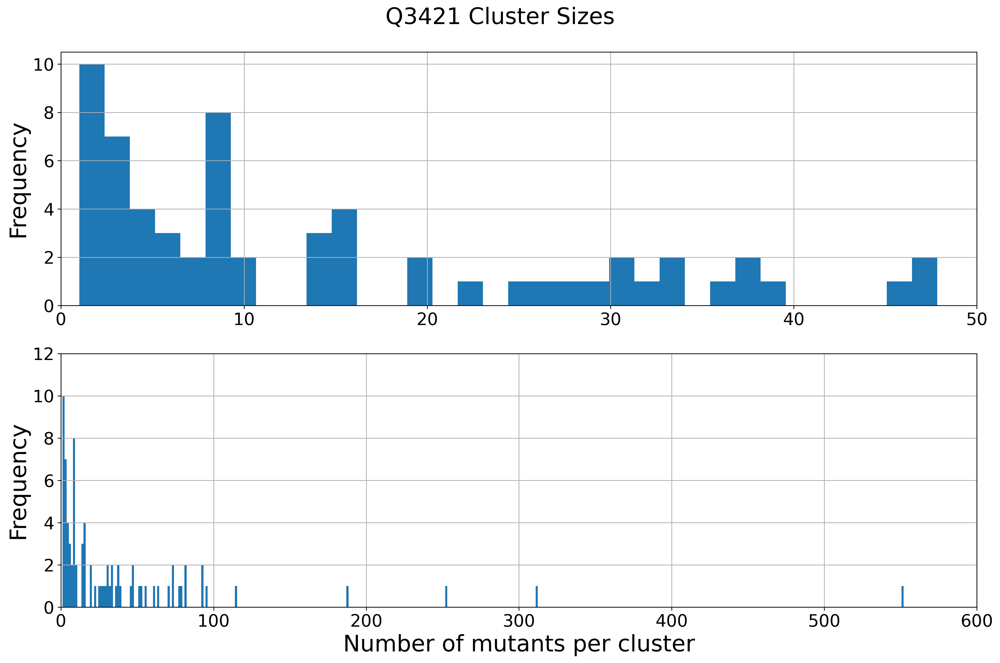

In [2]:
db_class = db

print('Original unique mutations:', len(db_class))

evolutionary = ['tranception', 'msa_transformer', 'esm1v', 'msa', 'esm2', 'ankh']
structural = ['mpnn', 'mif', 'mifst', 'esmif', 'mutcomputex']
supervised = ['MAESTRO', 'ThermoNet', 'INPS', 'PremPS', 'mCSM', 'DUET', 'ACDC', 'I-Mutant3.0', 'SAAFEC', 'MuPro']
untrained = ['DDGun']
potential = ['KORPM', 'PopMusic', 'SDM', 'korpm']
biophysical = ['cartesian_ddg', 'FoldX', 'Evo', 'Cartddg']
transfer = ['stability-oracle']

original_pred_cols = db_class.columns[db_class.columns.str.contains('|'.join(evolutionary + structural + supervised + untrained + potential + biophysical + transfer))]
original_pred_cols = list(original_pred_cols.drop(['reduced_msa_file', 'full_msa_file', 'tranception_dms', 'msa_weights']))#, 'msa_weights']))
original_pred_cols = [c for c in original_pred_cols if not 'runtime' in c]
original_pred_cols = [c for c in original_pred_cols if not 'cluster' in c]
original_pred_cols = [c for c in original_pred_cols if not 'overlaps' in c]
original_pred_cols = [c for c in original_pred_cols if not 'pll' in c]
print(original_pred_cols)

db_runtimes = db[[c for c in db.columns if 'runtime' in c]]

original_pred_cols_reduced = deepcopy(original_pred_cols)
for col in [f'esm1v_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)
for col in [f'msa_{i}_dir' for i in range(1,6)]:
    original_pred_cols_reduced.remove(col)

print(original_pred_cols_reduced)

db_class = db_class[original_pred_cols + ['ddG', 'cluster']]

#db_class_rescaled = db_class.copy(deep=True)
#db_class_rescaled[original_pred_cols] /= db_class_rescaled[original_pred_cols].std()

db_class['mpnn_rosetta_dir'] = db_class['cartesian_ddg_dir'] + db_class['mpnn_20_00_dir']
db_class['random_dir'] = np.random.normal(loc=0, size=len(db_class))
#db_class['korpm_dir'] = db_class['KORPMD_dir']
db_class['ddG_dir'] = db_class['ddG']

#db_class = db_class.drop([c+'_dir' for c in ['ACDCNND', 'FoldXD', 'DDGunD', 'CartddgD']], axis=1) #'PopMsD', 'TNetD'

print(f'Detected {len(db_class.loc[db["on_interface_dir"].astype(bool)])} interface mutations')

fig, axes = plt.subplots(2, figsize=(15, 10), dpi=300) 

db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[0])
axes[0].set_xlim([0, 50]) 
axes[0].tick_params(axis='x', labelsize=18) 
axes[0].set_ylabel('Frequency', fontsize=24)  

# Second plot
db_class.groupby('cluster').count().iloc[:, 0].hist(bins=400, ax=axes[1])
axes[1].set_xlim([0, 600]) 
axes[1].set_ylim([0, 12])  
axes[1].set_xlabel('Number of mutants per cluster', fontsize=24) 
axes[1].set_ylabel('Frequency', fontsize=24)
axes[1].tick_params(axis='x', labelsize=18)

plt.suptitle('Q3421 Cluster Sizes', fontsize=24)
plt.tight_layout()

db_class

db_class

In [3]:
# Clusters with >= or < 50 unique mutants
print((db_class.groupby('cluster').count().iloc[:, 0] >= 50).sum(), (db_class.groupby('cluster').count().iloc[:, 0] < 50).sum())

20 62


### Recursive Feature Addition (Figure 3C)

1758


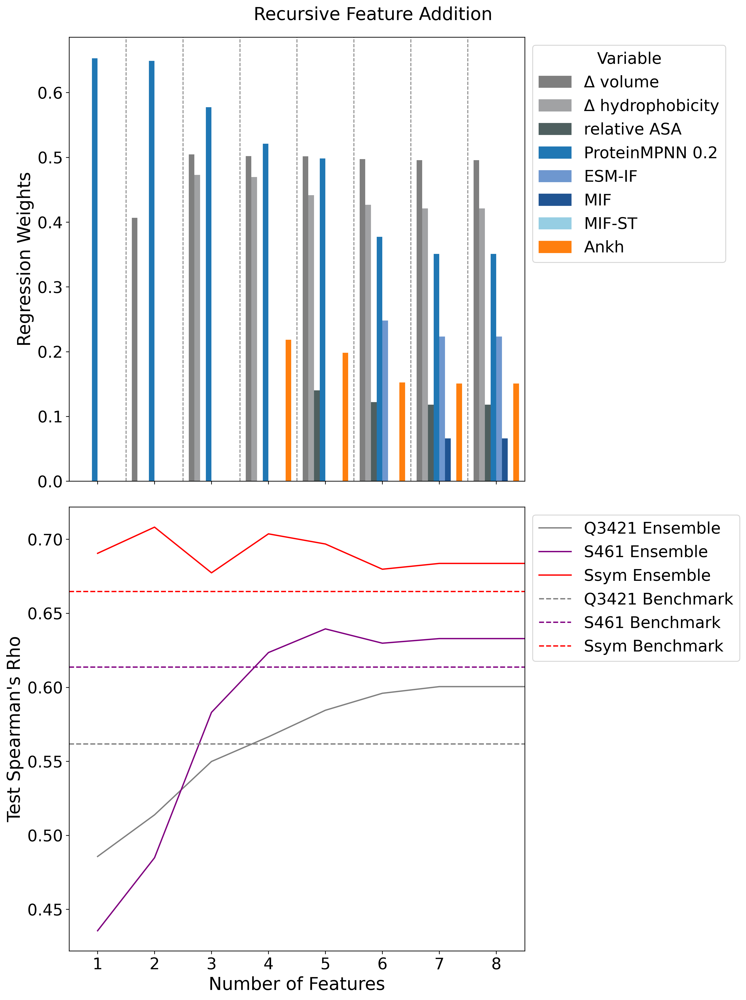

In [4]:
from sklearn.linear_model import Ridge, LinearRegression
from sklearn.kernel_ridge import KernelRidge
from sklearn.svm import SVR
from sklearn.preprocessing import StandardScaler, MinMaxScaler, PolynomialFeatures
import importlib
importlib.reload(analysis_utils)

cols2 = ['delta_kdh_dir', 'delta_vol_dir', 'rel_ASA_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mif_dir', 'mifst_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir'] #'mutcomputex_dir',
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
print(len(df_train))
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'q3421_pslm' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'q3421_pslm' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='q3421_pslm')

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'rfa_' in c], [c+'_dir' for c in df_test_q3421.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'q3421_pslm' in c]]
db_class = db_class.join(df_test_q3421[[c for c in df_test_q3421.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

### Recursive Feature Addition (All Models) (Supplementary Figure 9)

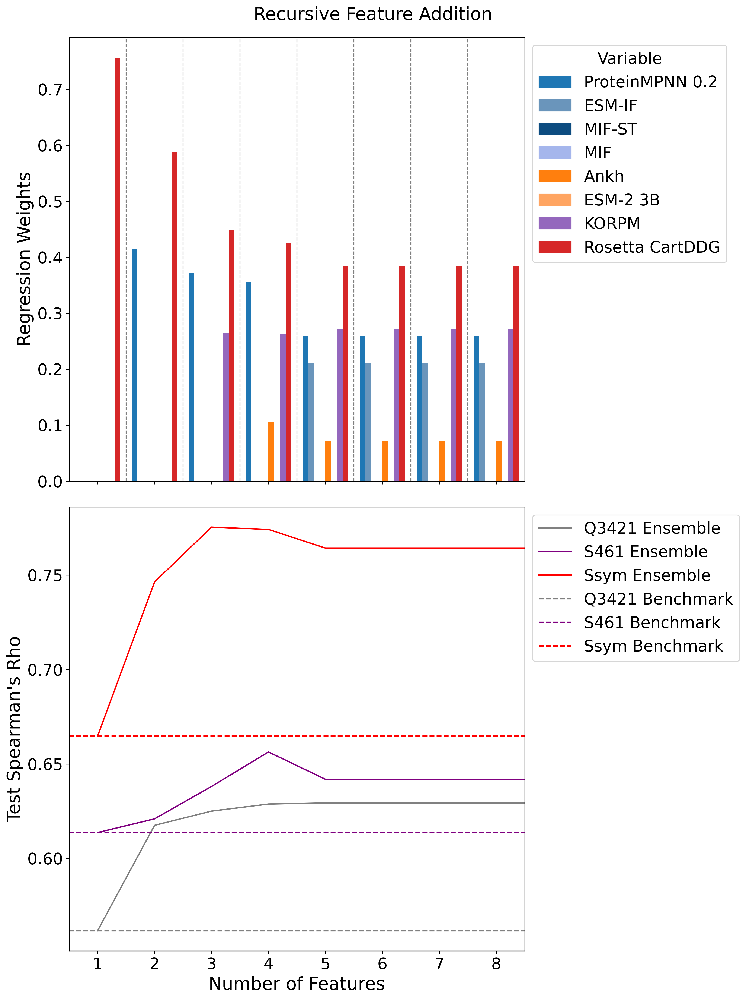

In [5]:
cols2 = ['cartesian_ddg_dir', 'korpm_dir', 'esmif_multimer_dir', 'mpnn_20_00_dir', 'mpnn_30_00_dir', 'esm2_3B_dir', 'mifst_dir', 'mif_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'ankh_dir', 'tranception_dir']#, 'mutcomputex_dir']
df_train = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0)
df_train = df_train.loc[~df_train['overlaps_seq_ssym']].loc[~df_train['overlaps_seq_s461']]
df_test = db.drop(['cluster','ddG'], axis=1).fillna(0) #.join(db_feats_2[[c for c in db_feats_2.columns if c in cols2]]).join(db_training).dropna(subset='ddG_dir').fillna(0).drop(['ProTherm', 'ddG'], axis=1).fillna(0)
df_test_s461 = pd.read_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv')).set_index('uid')
df_test_s461 = df_test_s461[[c for c in df_test_s461.columns if not 'q3421_all' in c]]
df_test_s461.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA'] else c for c in df_test_s461.columns]
df_test_ssym = pd.read_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv')).set_index('uid')
df_test_ssym = df_test_ssym[[c for c in df_test_ssym.columns if not 'q3421_all' in c]]
#df_test_ssym.columns = [c+'_dir' if c in ['delta_kdh', 'delta_vol', 'rel_ASA', 'ddG'] else c for c in df_test_ssym.columns]
df_test_ssym.columns = [c+'_dir' for c in df_test_ssym.columns]

dfs_test = {'q3421': df_test, 's461': df_test_s461, 'ssym': df_test_ssym}

test_scores, weights_df, dfs_test = analysis_utils.custom_recursive_feature_addition(df_train, dfs_test, cols2, 'ddG_dir', LinearRegression(positive=True), fillna=True, source='q3421_all')

df_test_q3421 = dfs_test['q3421']
df_test_q3421 = df_test_q3421.rename(dict(zip([c for c in df_test_q3421.columns if 'rfa_' in c], [c+'_dir' for c in df_test_q3421.columns if 'rfa_' in c])), axis=1)
db_class = db_class[[c for c in db_class.columns if not 'q3421_all' in c]]
db_class = db_class.join(df_test_q3421[[c for c in df_test_q3421.columns if 'rfa_' in c]])

df_test_s461 = dfs_test['s461']
df_test_s461 = df_test_s461.rename(dict(zip([c for c in df_test_s461.columns if 'rfa_' in c], [c+'_dir' for c in df_test_s461.columns if 'rfa_' in c])), axis=1)
df_test_s461.to_csv(os.path.join(path, 'data', 'analysis', 's461_analysis.csv'))

df_test_ssym = dfs_test['ssym']
df_test_ssym = df_test_ssym.rename(dict(zip([c for c in df_test_ssym.columns if '_dir' in c], [c[:-4] for c in df_test_ssym.columns if '_dir' in c])), axis=1)
df_test_ssym.to_csv(os.path.join(path, 'data', 'analysis', 'ssym_analysis.csv'))

### Non-bootstrapped Analysis of Q3421 (not in text)

In [6]:
# TABLE 1
# Note: due to changes in the dependencies and small changes to preprocessing,
# results have changed very slightly from the current revision, but do not affect
# the interpretation of results or conclusions

# could replace stats=() with ('n', 'MCC', 'auprc', 'ndcg', 'spearman')
# but then you would not be saving the other stats. 
# uncomment to_csv lines to save to a custom location
#db_class['code'] = db_class.index.str[:4]
summ = analysis_utils.compute_stats(db_class[original_pred_cols_reduced + ['cluster', 'ddG', 'mpnn_rosetta_dir']], 
                                    stats=('n', 'MCC', 'pred_positives', 'tp', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'tp', 'recall@k1.0', 'aumsc', 'auppc'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=0)
rcv = summ.copy(deep=True)
summ.to_csv('../data/extended/q3421_extended.csv')
tmp1 = summ #.loc[:,['n', 'MCC', 'auprc', 'spearman', 'weighted_ndcg', 'weighted_auprc', 'weighted_spearman']]
tmp = tmp1.sort_values(['measurement', 'weighted_spearman'], ascending=False).reset_index()

tmp['model'] = tmp['model'].map(remap_names_2)
tmp['measurement'] = tmp['measurement'].map({'ddG': 'ΔΔG', 'dTm': 'ΔTm'})
tmp.loc[tmp['model'].isin(['Gaussian noise', 'ΔΔG', 'ΔTm']), 'model_type'] = 'N/A'

remap_cols = {'auprc': 'AUPRC', 'spearman': 'ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR'}
tmp = tmp.rename(remap_cols, axis=1)
tmp = tmp[['measurement', 'model_type', 'model', 'n', 'MCC', 'AUPRC', 'ρ', 'wNDCG', 'wAUPRC', 'wρ', 'mean_t1s', 'Net Stabilization', 'pred_positives', 
 'mean_stabilization', 'True Positives', 'Sensitivity', 'MRR', 'recall@k1.0']]#, 'Accuracy']]
tmp = tmp.loc[tmp['model'].isin(['Rosetta CartDDG', 'ProteinMPNN mean', 'ProteinMPNN 0.3', 'ProteinMPNN 0.2', 'ESM-IF', 'MIF', 'ESM-IF(M)', 'Ankh', 
    'ESM-2 3B', 'ESM-2 15B', 'Structural', 'Evolutionary', 'Supervised', 'ESM-2 150M', 'ESM-2 650M', 'Ensemble', 'ESM-2 mean', 'ESM-IF mean', 
    'MIF_mean', 'Clustered Ensemble', 'Ensemble_2', 'ProteinMPNN 0.1', 'MIF-ST', 'KORPM', 'MSA-T_mean', 'MSA-T_1', 'Tranception', 'Tranception reweighted', 'ESM-1V mean', 
    'ESM-1V 2', 'Gaussian noise', 'ΔΔG label', 'ΔTm label', 'ProteinMPNN + Rosetta_CartDDG', 'Stability Oracle', 'MutComputeX'])]
tmp = tmp.dropna(subset='model').set_index(['measurement', 'model_type', 'model']).astype(float).round(3)
tmp

# < 2 minutes

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/21 [00:00<?, ?it/s]

n    MCC  AUPRC      ρ  \
measurement model_type   model                                                 
ΔΔG         biophysical  Rosetta CartDDG         3421.0  0.314  0.473  0.562   
            structural   ProteinMPNN 0.3         3421.0  0.286  0.456  0.481   
                         ProteinMPNN 0.2         3421.0  0.279  0.457  0.486   
                         MIF                     3421.0  0.266  0.437  0.480   
                         ESM-IF                  3418.0  0.243  0.430  0.452   
                         ProteinMPNN 0.1         3421.0  0.295  0.462  0.479   
                         ESM-IF(M)               3421.0  0.228  0.414  0.426   
            potential    KORPM                   3421.0  0.257  0.400  0.471   
            structural   MIF-ST                  3421.0  0.216  0.381  0.402   
            evolutionary ESM-2 650M              3421.0  0.199  0.363  0.291   
                         Ankh                    3421.0  0.172  0.344  0.317   
                         ESM-2 15B               3421.0  0.166  0.328  0.257   
                         ESM-2 3B                3421.0  0.173  0.329  0.261   
                         ESM-2 150M              3421.0  0.149  0.336  0.219   
                         Tranception reweighted  3409.0  0.148  0.327  0.270   
                         Tranception             3409.0  0.141  0.324  0.265   
                         ESM-1V mean             1974.0  0.211  0.365  0.275   

                                                 wNDCG  wAUPRC     wρ  \
measurement model_type   model                                          
ΔΔG         biophysical  Rosetta CartDDG         0.671   0.530  0.441   
            structural   ProteinMPNN 0.3         0.672   0.522  0.409   
                         ProteinMPNN 0.2         0.657   0.532  0.407   
                         MIF                     0.651   0.507  0.401   
                         ESM-IF                  0.642   0.499  0.400   
                         ProteinMPNN 0.1         0.672   0.539  0.396   
                         ESM-IF(M)               0.636   0.486  0.375   
            potential    KORPM                   0.636   0.503  0.359   
            structural   MIF-ST                  0.611   0.474  0.347   
            evolutionary ESM-2 650M              0.610   0.452  0.285   
                         Ankh                    0.611   0.474  0.277   
                         ESM-2 15B               0.596   0.441  0.259   
                         ESM-2 3B                0.597   0.442  0.254   
                         ESM-2 150M              0.612   0.438  0.245   
                         Tranception reweighted  0.579   0.420  0.240   
                         Tranception             0.579   0.425  0.232   
                         ESM-1V mean             0.587   0.443  0.225   

                                                 mean_t1s  Net Stabilization  \
measurement model_type   model                                                 
ΔΔG         biophysical  Rosetta CartDDG            0.575              14.95   
            structural   ProteinMPNN 0.3            0.513               1.73   
                         ProteinMPNN 0.2            0.305              19.39   
                         MIF                        0.427             -30.68   
                         ESM-IF                     0.643              26.26   
                         ProteinMPNN 0.1            0.441              51.04   
                         ESM-IF(M)                  0.528             -27.95   
            potential    KORPM                      0.226            -247.60   
            structural   MIF-ST                     0.143             -15.87   
            evolutionary ESM-2 650M                 0.137             -67.74   
                         Ankh                       0.153             -14.90   
                         ESM-2 15B                  0.036              -2.92   
                         

### Recovery Curves (Visualization of Stable Mutant Enrichment, Figure 2)

  0%|          | 0/1 [00:00<?, ?it/s]

  0%|          | 0/60 [00:00<?, ?it/s]

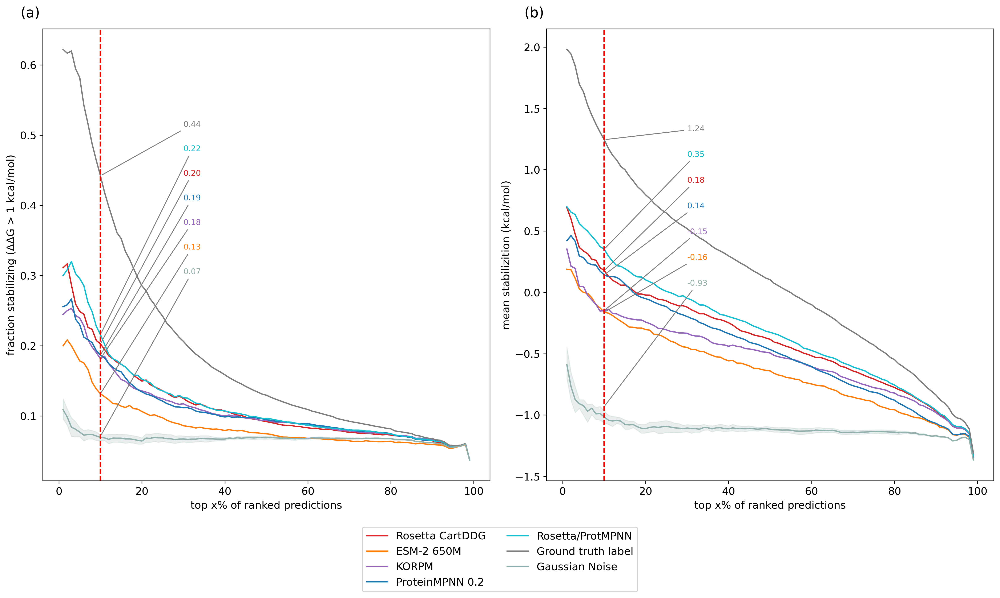

In [7]:
db_class_r = db_class.copy(deep=True)
db_class_r['random_2_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_3_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_4_dir'] = np.random.normal(loc=0, size=len(db_class_r))
db_class_r['random_5_dir'] = np.random.normal(loc=0, size=len(db_class_r))
class_result_new = analysis_utils.compute_stats(db_class_r, stats=('aumsc', 'auppc'), measurements=['ddG'], grouper='cluster', n_bootstraps=0)
crn = class_result_new.reset_index()
crn.loc[crn['model'].str.contains('random'), 'model'] = 'random_dir'
crn = crn.set_index(['measurement', 'model_type', 'model'])
crn
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'cartesian_ddg_dir', 'mpnn_rosetta_dir', 'korpm_dir', 'esm2_650M_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc']) #'q3421_pslm_rfa_5_dir', 'stability-oracle_dir',

# < 4 minutes

### Recovery Curves (Visualization of Stable Mutant Enrichment, Supplementary Figure 6)

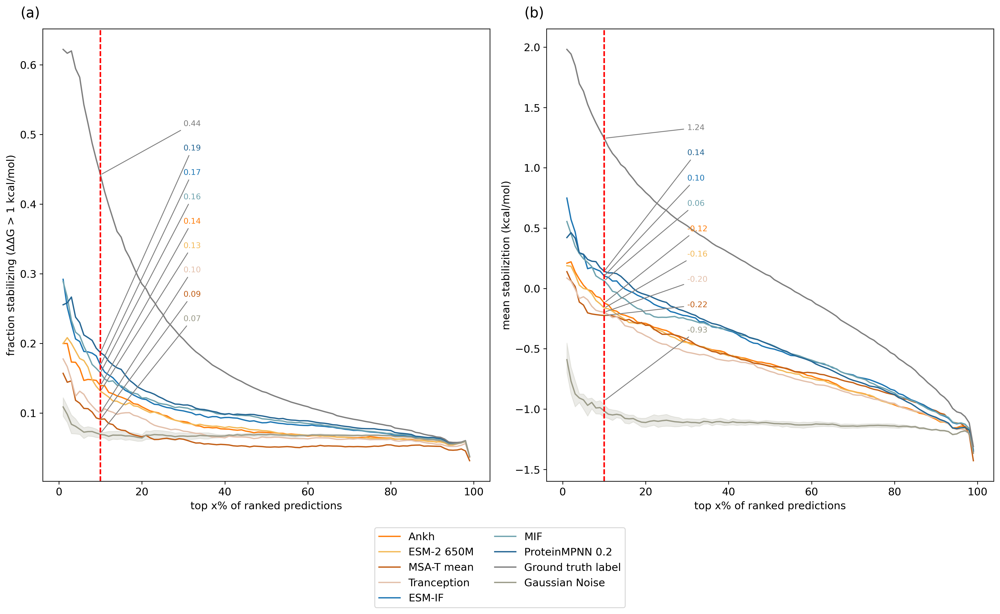

In [8]:
analysis_utils.recovery_curves(crn, ['mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'ankh_dir', 'msa_transformer_mean_dir', 'esm2_650M_dir', 'tranception_dir', 'mutcomputex_dir', 'ddG_dir', 'random_dir'], spacing=0.07, measurements=['ddG'], plots=['auppc', 'aumsc'])

### Bootstrapped Q3421 Analysis (Used for Figure 1 and Extended Data Table 1)

In [9]:
summ = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'ndcg', 'mean_t1s', 'mean_reciprocal_rank', 'mean_stabilization', 'net_stabilization', 'sensitivity', 'recall@k0.0', 'recall@k1.0'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp1 = summ.reset_index()
#tmp1.to_csv('../data/extended/q3421_extended_bootstrapped.csv')

# < 1 minute

In [10]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp1.sort_values('net_stabilization_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + [
            'random_dir', 
            'ddG_dir', 
            'q3421_pslm_rfa_2_dir', 
            'q3421_pslm_rfa_3_dir', 
            'q3421_pslm_rfa_4_dir',
            'q3421_pslm_rfa_5_dir',
            'mpnn_rosetta_dir'])
            ].drop('measurement', axis=1)

s4 = s3[['model_type', 'model', 
    'recall@k1.0_mean', 'recall@k1.0_std',
    'ndcg_mean', 'ndcg_std',
    'weighted_ndcg_mean', 'weighted_ndcg_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'auprc_mean', 'auprc_std', 
    'MCC_mean', 'MCC_std', 
    'mean_stabilization_mean', 'mean_stabilization_std', 
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
#s6.to_csv('../data/extended/q3421_extended_bootstrapped_formatted.csv')
s6

,Model Type,Model,Recall @ k,NDCG,wNDCG,Spearman's ρ,wρ,AUPRC,MCC,Mean Stabilization,Net Stabilization
0,unknown,ΔΔG label,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.056 ± 0.14,1449.496 ± 317.29
1,structural,Rosetta/ProtMPNN,0.314 ± 0.03,0.66 ± 0.04,0.705 ± 0.02,0.593 ± 0.04,0.464 ± 0.04,0.513 ± 0.03,0.32 ± 0.02,0.195 ± 0.05,160.966 ± 36.22
2,ensemble,Ensemble 2 Feats,0.28 ± 0.02,0.656 ± 0.04,0.716 ± 0.02,0.511 ± 0.03,0.435 ± 0.05,0.479 ± 0.05,0.325 ± 0.04,0.206 ± 0.19,150.106 ± 114.88
3,structural,ProteinMPNN 0.1,0.241 ± 0.02,0.667 ± 0.05,0.706 ± 0.01,0.483 ± 0.01,0.401 ± 0.04,0.469 ± 0.03,0.303 ± 0.01,0.106 ± 0.11,105.324 ± 109.72
4,evolutionary,Tranception reweighted,0.144 ± 0.01,0.596 ± 0.04,0.619 ± 0.01,0.3 ± 0.03,0.248 ± 0.02,0.353 ± 0.03,0.181 ± 0.02,0.245 ± 0.23,67.99 ± 69.2
5,structural,MIF-ST,0.227 ± 0.03,0.641 ± 0.04,0.647 ± 0.01,0.433 ± 0.03,0.349 ± 0.01,0.4 ± 0.03,0.241 ± 0.02,0.074 ± 0.08,47.744 ± 62.0
6,evolutionary,Tranception,0.15 ± 0.02,0.589 ± 0.04,0.622 ± 0.01,0.293 ± 0.02,0.238 ± 0.02,0.349 ± 0.03,0.174 ± 0.01,0.162 ± 0.19,46.324 ± 60.97
7,ensemble,Ensemble 4 Feats,0.274 ± 0.02,0.657 ± 0.03,0.716 ± 0.02,0.548 ± 0.03,0.46 ± 0.04,0.474 ± 0.05,0.318 ± 0.03,0.053 ± 0.18,38.422 ± 206.79
8,evolutionary,ESM-2 15B,0.183 ± 0.01,0.604 ± 0.05,0.644 ± 0.01,0.312 ± 0.04,0.272 ± 0.04,0.36 ± 0.02,0.192 ± 0.03,0.069 ± 0.13,24.496 ± 46.43
9,structural,ProteinMPNN 0.2,0.244 ± 0.02,0.652 ± 0.05,0.691 ± 0.02,0.488 ± 0.02,0.411 ± 0.04,0.461 ± 0.04,0.283 ± 0.01,0.008 ± 0.09,14.542 ± 98.88


### Visualization of Prediction Distributions (Supplementary Figure 1)

      cluster  variable      value
417        77  ESM-2 3B -10.724691
418        77  ESM-2 3B  -7.877060
419        77  ESM-2 3B   1.481350
420        77  ESM-2 3B -14.198873
421        77  ESM-2 3B -10.867790
...       ...       ...        ...
6827       78       ΔΔG  -5.020000
6828       78       ΔΔG  -4.580000
6829       78       ΔΔG   1.540000
6830       78       ΔΔG  -2.870000
6831       78       ΔΔG  -1.200000

[602 rows x 3 columns]


<Axes: xlabel='cluster', ylabel='value'>

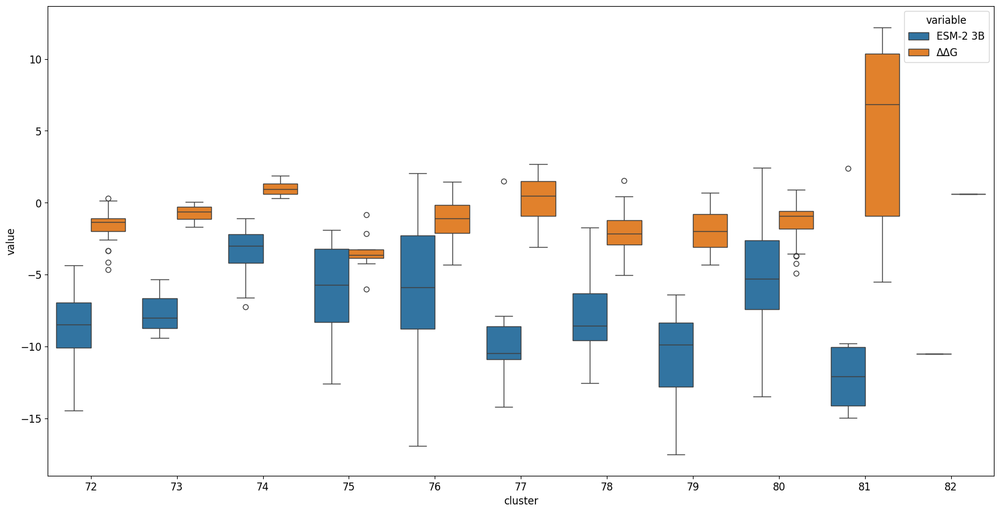

In [11]:
db_plot = db_class.copy(deep=True)
db_plot = db_plot.loc[~db_plot['ddG_dir'].isna()]
db_plot = db_plot.rename({'ddG_dir': 'ΔΔG', 'esm2_3B_dir': 'ESM-2 3B'}, axis=1)
db_plot = db_plot[['cluster', 'ESM-2 3B', 'ΔΔG']].melt(id_vars='cluster')
db_plot = db_plot.loc[db_plot['cluster']>71]
print(db_plot)
fig, ax = plt.subplots(figsize=(20, 10))
sns.boxplot(db_plot, x='cluster', y='value', hue='variable', ax=ax)

### Supplementary Table 5

In [12]:
summ2 = analysis_utils.compute_stats(db_class, 
                                    stats=('n', 'MCC', 'tp', 'fp', 'tn', 'fn', 'auprc', 'spearman', 'accuracy', 'mse', 'net_stabilization', 'mean_stabilization', 'precision', 'recall'), 
                                    measurements=['ddG'], grouper='cluster', n_classes=2, n_bootstraps=5, quiet=True)
tmp2 = summ2.reset_index()

# < 1 minute

In [13]:
remap_names = analysis_utils.remap_names
remap_names_2 = analysis_utils.remap_names_2

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k',
    'mean_squared_error': 'MSE'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = summ2.sort_values('mean_squared_error_mean', ascending=True).dropna(how='all', axis=1).reset_index()
s3 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir'])].drop('measurement', axis=1)
s4 = s3[['model_type', 'model', 
    'mean_squared_error_mean', 'mean_squared_error_std',
    'accuracy_mean', 'accuracy_std',
    'spearman_mean', 'spearman_std',
    'weighted_spearman_mean', 'weighted_spearman_std',
    'net_stabilization_mean', 'net_stabilization_std',
    ]]
s4['model'] = s4['model'].map(remap_names_2)
s5 = s4.set_index(['model_type', 'model'])
s5.columns = [new_remap_cols[c] for c in s5.columns]
s5
# Iterate over the DataFrame and update the mean columns
for column in s5.columns:
    if 'mean' in column:
        stdev_column = column.replace('mean', 'stdev')
        s5[column] = s5[column].round(3).astype(str) + ' ± ' + s5[stdev_column].round(2).astype(str)

# Drop the standard deviation columns
s5 = s5[[col for col in s5.columns if 'stdev' not in col]]
s5.columns = [col[:-5] for col in s5.columns]
s6 = s5.reset_index().rename({'model_type': 'Model Type', 'model': 'Model'}, axis=1)
s6

,Model Type,Model,MSE,Accuracy,Spearman's ρ,wρ,Net Stabilization
0,unknown,ΔΔG label,0.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1.0 ± 0.0,1548.948 ± 411.38
1,potential,KORPM,4.701 ± 0.93,0.735 ± 0.01,0.43 ± 0.01,0.328 ± 0.06,-725.722 ± 311.14
2,structural,ESM-IF,5.868 ± 0.69,0.787 ± 0.01,0.438 ± 0.02,0.397 ± 0.02,-87.88 ± 211.99
3,structural,ESM-IF(M),5.871 ± 0.69,0.781 ± 0.01,0.404 ± 0.05,0.369 ± 0.02,-248.928 ± 356.48
4,evolutionary,Tranception,5.917 ± 0.69,0.796 ± 0.02,0.28 ± 0.03,0.214 ± 0.04,6.702 ± 52.75
5,evolutionary,Tranception reweighted,5.92 ± 0.69,0.798 ± 0.02,0.287 ± 0.03,0.231 ± 0.03,33.756 ± 45.84
6,unknown,Gaussian Noise,7.125 ± 0.67,0.497 ± 0.0,-0.024 ± 0.02,-0.003 ± 0.01,-3790.634 ± 774.38
7,structural,ProteinMPNN 0.3,8.159 ± 1.27,0.781 ± 0.01,0.437 ± 0.03,0.408 ± 0.04,-209.56 ± 313.78
8,structural,ProteinMPNN 0.2,8.428 ± 1.22,0.789 ± 0.01,0.447 ± 0.04,0.409 ± 0.04,-73.586 ± 262.84
9,structural,ProteinMPNN 0.1,9.107 ± 1.3,0.796 ± 0.01,0.438 ± 0.03,0.402 ± 0.05,-14.886 ± 269.77


### Figure 1

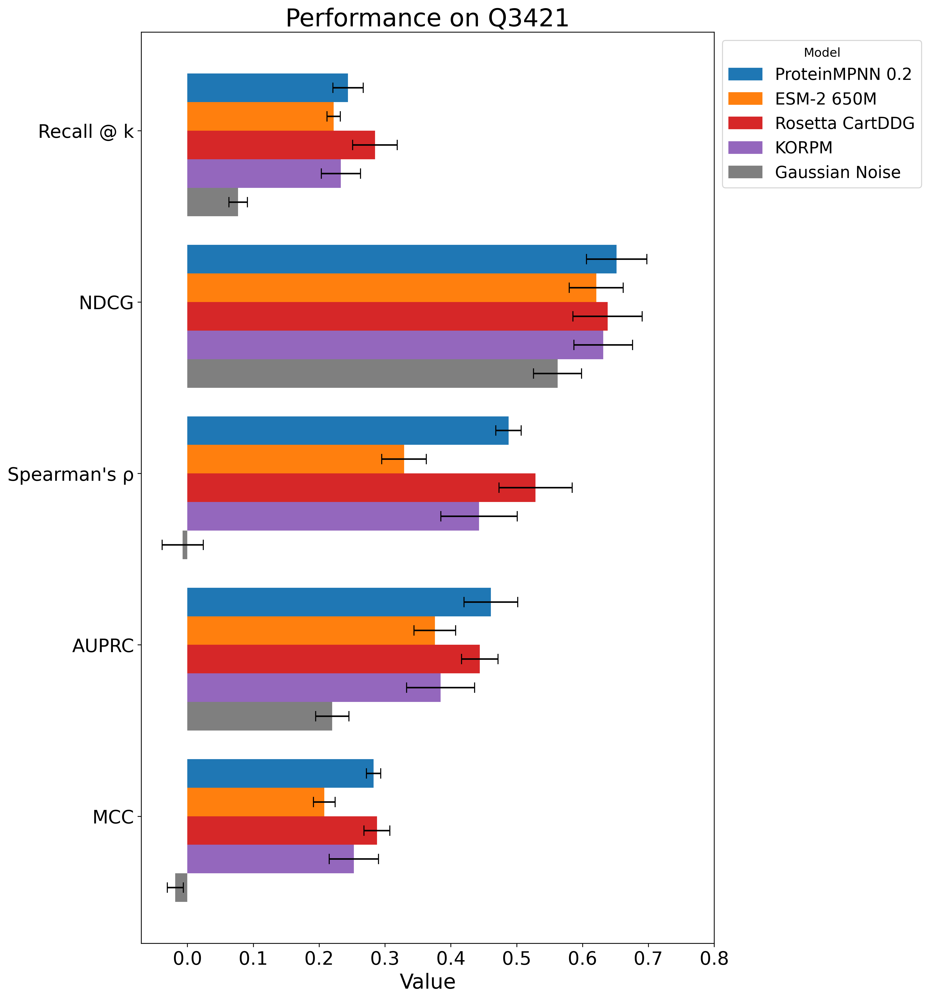

In [14]:
tmp3 = tmp1.copy(deep=True)

remap_cols = {'auprc': 'AUPRC', 'spearman': 'Spearman\'s ρ', 'auppc': 'mean PPC', 'aumsc': 'mean MSC', 'weighted_ndcg': 'wNDCG', 'ndcg': 'NDCG',
    'weighted_spearman': 'wρ', 'weighted_auprc': 'wAUPRC', 'tp': 'True Positives', 'sensitivity': 'Sensitivity', 'mean_stabilization': 'Mean Stabilization',
    'net_stabilization': 'Net Stabilization', 'accuracy': 'Accuracy', 'mean_reciprocal_rank': 'MRR', 'n': 'n', 'MCC': 'MCC', 'recall@k1.0': 'Recall @ k'}

new_remap_cols = {}
for key, value in remap_cols.items():
    new_remap_cols[key + '_mean'] = value + ' mean'
    new_remap_cols[key + '_std'] = value + ' stdev'

s2 = tmp3.sort_values('spearman_mean', ascending=False).dropna(how='all', axis=1).reset_index()
s4 = s2.loc[s2['model'].isin(original_pred_cols_reduced + ['random_dir', 'ddG_dir', 'mpnn_rosetta_dir'])]
s5 = s4

tmp2 = s5[[ 'model',  
            'MCC_mean', 'MCC_std',
            'auprc_mean', 'auprc_std',
            #'weighted_spearman_mean', 'weighted_spearman_std',
            'spearman_mean', 'spearman_std',
            #'weighted_ndcg_mean', 'weighted_ndcg_std',
            'ndcg_mean', 'ndcg_std',
            'recall@k1.0_mean', 'recall@k1.0_std', 
            ]].set_index('model')

tmp2.columns = [new_remap_cols[c] for c in tmp2.columns]
tmp2 = tmp2.reset_index().drop_duplicates()

analysis_utils.make_bar_chart(tmp2, models=['mpnn_20_00', 'esm2_650M', 'stability-oracle', 'cartesian_ddg', 'korpm', 'DDGun3D', 'MAESTRO', 'random'], title='Q3421', xlim=(-0.07, 0.8), figsize=(10, 16))

In [15]:
db_new = pd.read_csv('~/PSLMs/data/inference/tranception_results.csv', index_col=0)
db_new = db_new.rename({'tranception_weights_dir': 'tranception_new_dir', 'runtime_tranception_weights_dir': 'runtime_tranception_new_dir'}, axis=1)
db['uid3'] = db['code'] + '_' + (db['position']-db['offset_up']).astype(str) + db['mutation']
db_new = db.reset_index().set_index('uid3').join(db_new).reset_index().set_index('uid')
db_new[['tranception_new_dir']]

,tranception_new_dir
uid,
1A23_30S,-0.109360
1A23_32L,-0.059789
1A23_32S,-0.032388
1A23_32Y,-0.039155
1A23_33S,-0.075979
...,...
5CRO_26L,-0.105731
5CRO_26Q,-0.045138
5CRO_26V,-0.045453


### Additional Figure describing correlation between predictions and scores of two selected models

     code  obs type tranception_dir tranception_weights_dir     marker
2    1A5E    3  ddG             0.5                    -0.5  Eukaryota
3    1AAR   10  ddG        0.042424                0.151515  Eukaryota
4    1AG2    9  ddG             0.2                0.416667  Eukaryota
5    1AJ3   67  ddG         0.35437                0.399485  Eukaryota
8    1AMQ   20  ddG        0.668924                0.653123   Bacteria
9    1ANK    4  ddG             0.2                     0.4   Bacteria
11   1APS   27  ddG        0.154527                0.152084  Eukaryota
12   1ARR   64  ddG        0.174601                0.189764    Viruses
13   1AYF   11  ddG             0.0                     0.3  Eukaryota
16   1BNI  171  ddG        0.589706                0.580921   Bacteria
17   1BP2    9  ddG        0.733333                     0.7  Eukaryota
18   1BPI   61  ddG        0.834063                 0.83401  Eukaryota
19   1BTA   16  ddG       -0.349043               -0.377025   Bacteria
20   1

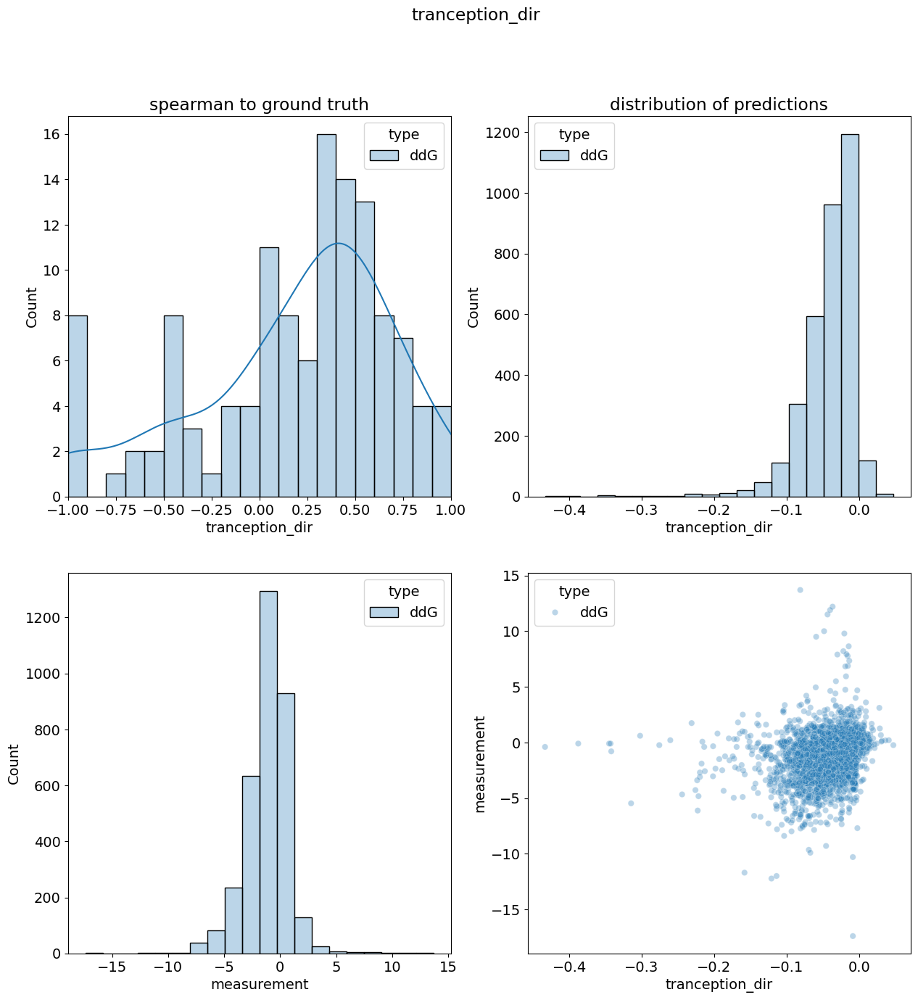

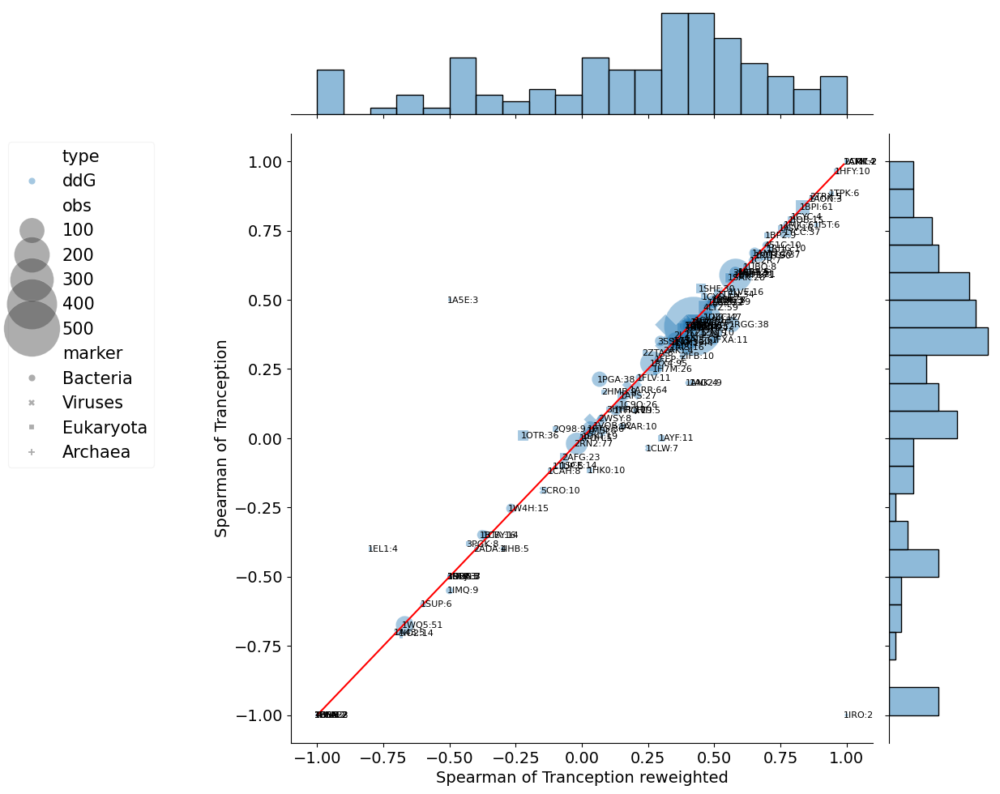

tranception_dir tranception_weights_dir
ddG n_total                        3397                    3397
    ungrouped_spearman         0.260653                0.265555
    n_proteins                      147                     147
    n_proteins_spearman             124                     124
    avg_spearman               0.185861                0.203342
    weighted_spearman          0.260135                0.269321
    runtime (s)                     NaN                     NaN

In [16]:
db_class_2 = db_class.copy(deep=True)
#db_class_2 = db_class_2.join(db_new[['tranception_new_dir']])
db_class_2['ddG_dir'] = db_class_2['ddG']
db_class_2['marker'] = db['origin']
db_class_2['code'] = db_class_2.reset_index('uid2').index.str[:4]
analysis_utils.correlations(db_class_2, None, stat='spearman', 
    score_name='tranception_dir', score_name_2='tranception_weights_dir', min_obs=1, group=True, plot=True, out=True, runtime=False)

In [17]:
db_class_2

,,mif_dir,mifst_dir,mpnn_10_00_dir,mpnn_20_00_dir,mpnn_30_00_dir,esm2_3B_dir,esmif_multimer_dir,esm2_15B_half_dir,esmif_monomer_dir,tranception_weights_dir,...,q3421_all_rfa_5_dir,q3421_all_rfa_6_dir,q3421_all_rfa_7_dir,q3421_all_rfa_8_dir,q3421_all_rfa_9_dir,q3421_all_rfa_10_dir,q3421_all_rfa_11_dir,q3421_all_rfa_12_dir,marker,code
uid,uid2,,,,,,,,,,,,,,,,,,,,,
1A23_30S,1A23_30S,1.864485,-6.805952,1.810260,2.009976,-1.147786,-11.571676,-0.043713,-11.668701,-0.043712,-0.108554,...,-0.211306,-0.211306,-0.211306,-0.211306,-0.211306,-0.211306,-0.275311,-0.301720,Bacteria,1A23
1A23_32L,1A23_32L,1.119251,-7.800102,0.095243,2.145201,-0.386124,-13.755667,-0.042389,-13.076172,-0.042389,-0.059629,...,0.293177,0.293177,0.293177,0.293177,0.293177,0.293177,0.241291,0.228303,Bacteria,1A23
1A23_32S,1A23_32S,-0.854073,-5.414868,0.301296,0.877654,0.752050,-8.291791,-0.029983,-10.436035,-0.029983,-0.032270,...,-0.386681,-0.386681,-0.386681,-0.386681,-0.386681,-0.386681,-0.384620,-0.389462,Bacteria,1A23
1A23_32Y,1A23_32Y,1.528646,-3.414633,-0.108550,0.747990,0.164768,-8.121881,-0.020219,-9.415039,-0.020219,-0.039056,...,0.368355,0.368355,0.368355,0.368355,0.368355,0.368355,0.357037,0.350743,Bacteria,1A23
1A23_33S,1A23_33S,0.348253,-5.093968,1.341104,-0.472430,0.157554,-12.002896,-0.024960,-12.722168,-0.024960,-0.076600,...,-0.606894,-0.606894,-0.606894,-0.606894,-0.606894,-0.606894,-0.589527,-0.600918,Bacteria,1A23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5CRO_26L,5CRO_26L,-0.438132,-0.126320,0.130304,0.337329,0.194948,-3.150103,-0.038055,-2.374512,-0.037373,-0.095336,...,-0.087831,-0.087831,-0.087831,-0.087831,-0.087831,-0.087831,-0.089260,-0.116398,Viruses,5CRO
5CRO_26Q,5CRO_26Q,0.140129,0.700469,1.668023,1.180899,1.713544,-2.508844,-0.006247,-2.625244,-0.004605,-0.045372,...,0.344443,0.344443,0.344443,0.344443,0.344443,0.344443,0.357979,0.342037,Viruses,5CRO
5CRO_26V,5CRO_26V,0.501243,1.538724,1.425710,0.879769,0.474643,-3.204980,0.032355,-2.228027,0.037691,-0.047876,...,0.285473,0.285473,0.285473,0.285473,0.285473,0.285473,0.276369,0.262905,Viruses,5CRO


### Figure 4 a&b

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_all_rfa_5_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'mif_dir', 'esmif_multimer_dir', 'korpm_dir', 'mifst_dir', 'ankh_dir', 'esm2_650M_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
0 >= ΔΔG > -1.5    931
ΔΔG <= -1.5        800
ΔΔG > 0            497
Name: n, dtype: int64


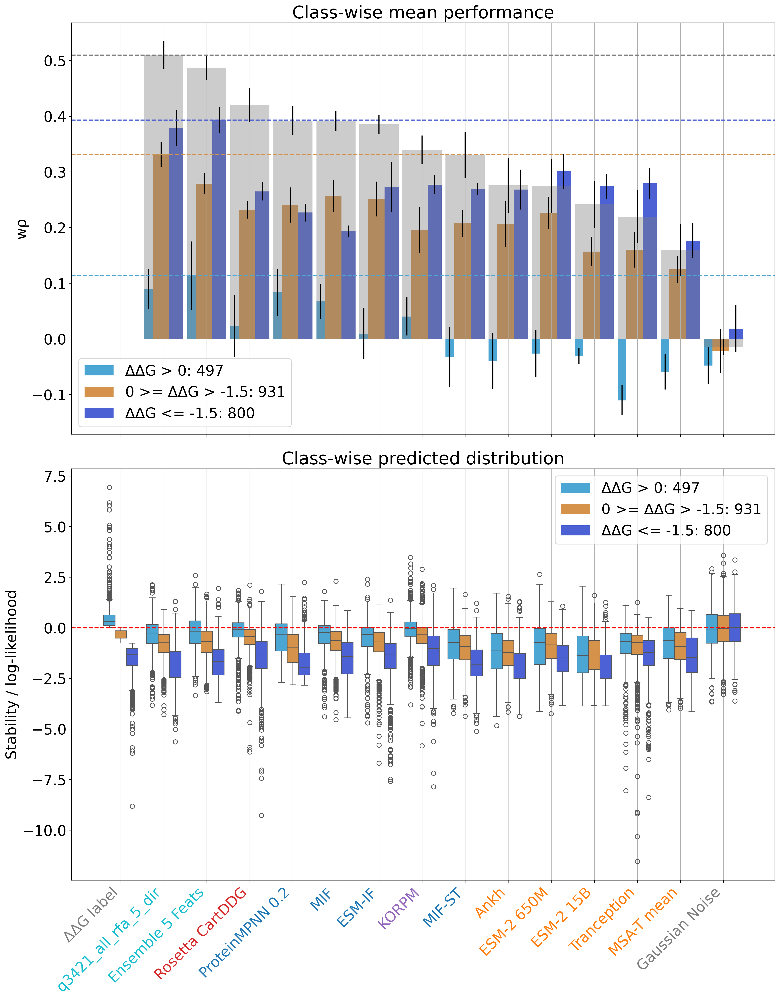

In [18]:
subset = ['q3421_pslm_rfa_5_dir',
          'q3421_all_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            #'mpnn_10_00_dir',
            'mpnn_20_00_dir',
            #'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

db_complete = db_class.join(db[[c for c in db.columns if not c in db_class.columns]], how='left')
db_complete['ddG_dir'] = db_complete['ddG']
db_complete['ΔΔG'] = db_complete['ddG']
#db_complete = db_complete.loc[~db_complete['ProTherm'].astype(bool)]

current_feats = ['ΔΔG', 'ddG']
# fillna only applies to a handful of predictions from Stability Oracle
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']].fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'ΔΔG', 
                        split_col_2 = None, 
                        threshold_1 = 0, 
                        threshold_2 = -1.5, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset = subset,
                        grouper = 'cluster'
                        )  
# < 10 seconds

In [19]:
db_complete['conservation']

uid       uid2    
1A23_30S  1A23_30S    98.824080
1A23_32L  1A23_32L    33.373224
1A23_32S  1A23_32S    33.373224
1A23_32Y  1A23_32Y    33.373224
1A23_33S  1A23_33S    98.163276
                        ...    
5CRO_26L  5CRO_26L     1.154930
5CRO_26Q  5CRO_26Q     1.154930
5CRO_26V  5CRO_26V     1.154930
5CRO_26W  5CRO_26W     1.154930
5CRO_36S  5CRO_36S    34.845070
Name: conservation, Length: 3421, dtype: float64

### Figure 4 c&d

  0%|          | 0/5 [00:00<?, ?it/s]

conservation > 80% : 374
conservation <= 80% : 1851
['ddG_dir', 'q3421_all_rfa_5_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mpnn_20_00_dir', 'esmif_multimer_dir', 'mif_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
conservation <= 80    1851
conservation > 80      374
Name: n, dtype: int64


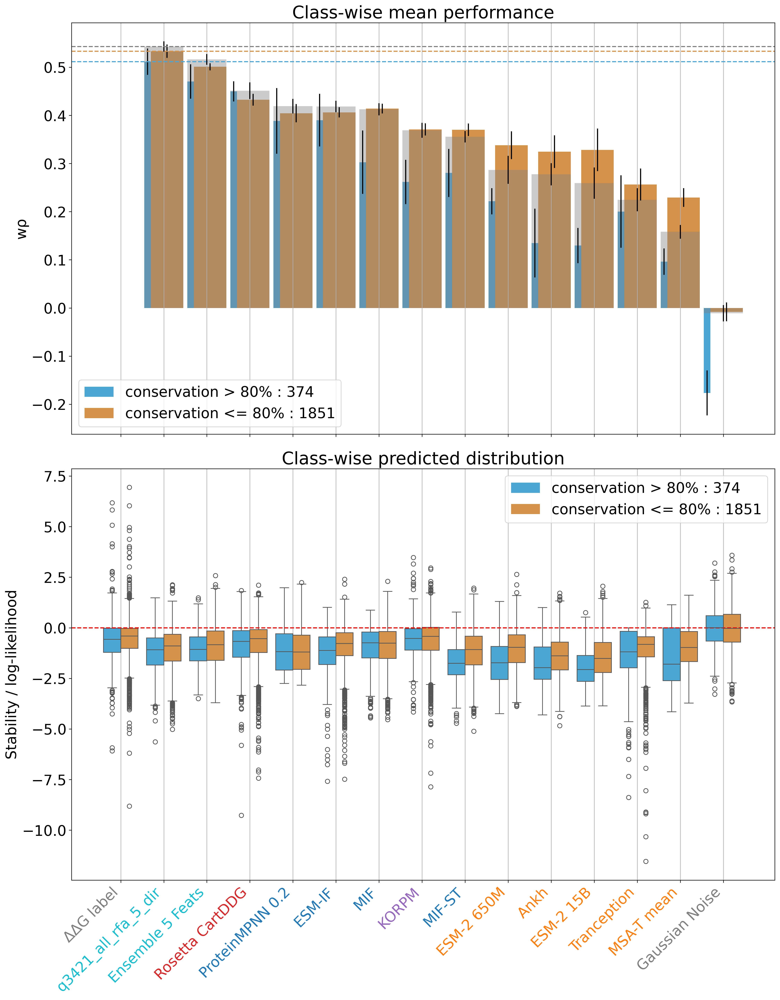

In [20]:
importlib.reload(analysis_utils)
current_feats = ['conservation', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'conservation', 
                        split_col_2 = None, 
                        threshold_1 = 80, 
                        threshold_2 = None, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps= 5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 3

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'mpnn_10_00_dir', 'mif_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
1 >= delta_vol > -1     552
delta_vol <= -1        1166
delta_vol > 1           324
Name: n, dtype: int64


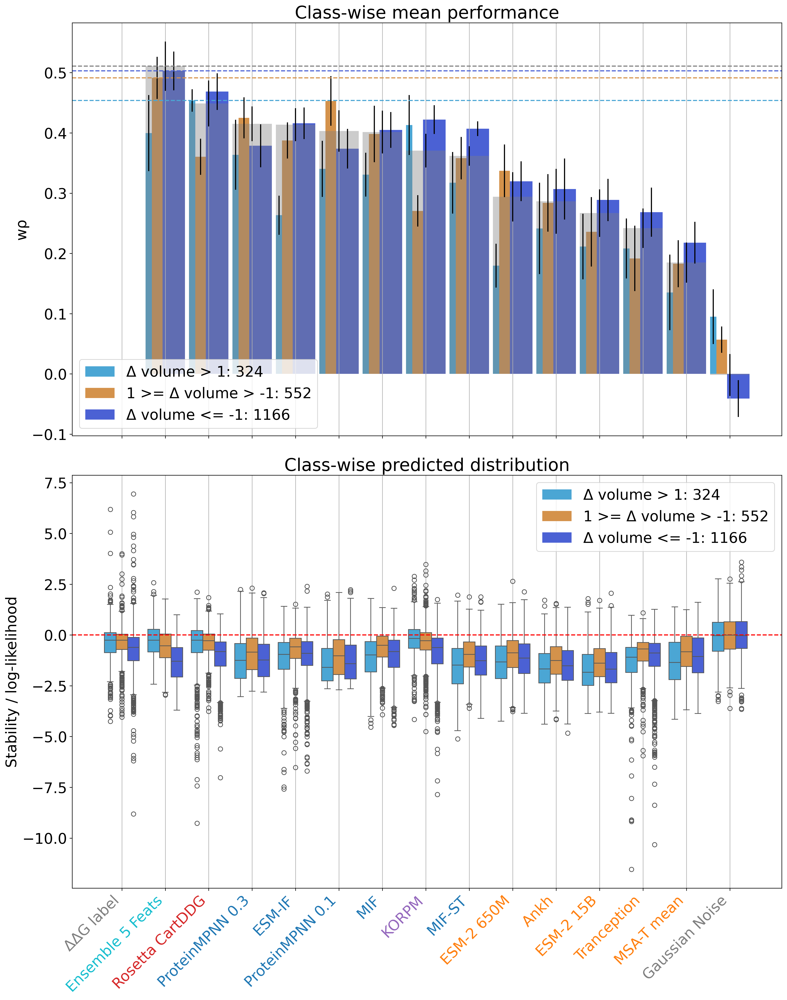

In [23]:
subset = ['q3421_pslm_rfa_5_dir',
            #'mpnn_rosetta_dir',
            'cartesian_ddg_dir',
            'korpm_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'esm2_650M_dir',
            'esm2_15B_half_dir',
            'ankh_dir',
            'esmif_multimer_dir',
            'mpnn_10_00_dir',
            #'mpnn_20_00_dir',
            'mpnn_30_00_dir',
            'mif_dir',
            'mifst_dir',
            #'mutcomputex_dir',
            #'stability-oracle_dir',
            'random_dir',
            'ddG_dir']

# Figure 1 c + d

db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
db_fig = db_fig.rename({'delta_vol_dir': 'delta_vol'}, axis=1)
db_fig = db_fig.fillna(0)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_vol', 
                        split_col_2 = None, 
                        threshold_1 = 1, 
                        threshold_2 = -1, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Extended Data Figure 4

  0%|          | 0/5 [00:00<?, ?it/s]

['ddG_dir', 'q3421_pslm_rfa_5_dir', 'cartesian_ddg_dir', 'mpnn_30_00_dir', 'esmif_multimer_dir', 'mif_dir', 'mpnn_10_00_dir', 'korpm_dir', 'mifst_dir', 'esm2_650M_dir', 'ankh_dir', 'esm2_15B_half_dir', 'tranception_dir', 'msa_transformer_mean_dir', 'random_dir']
class
delta_kdh <= 0 & rel_ASA <= 0.2    521
delta_kdh <= 0 & rel_ASA > 0.2     441
delta_kdh > 0 & rel_ASA <= 0.2     358
delta_kdh > 0 & rel_ASA > 0.2      551
Name: n, dtype: int64


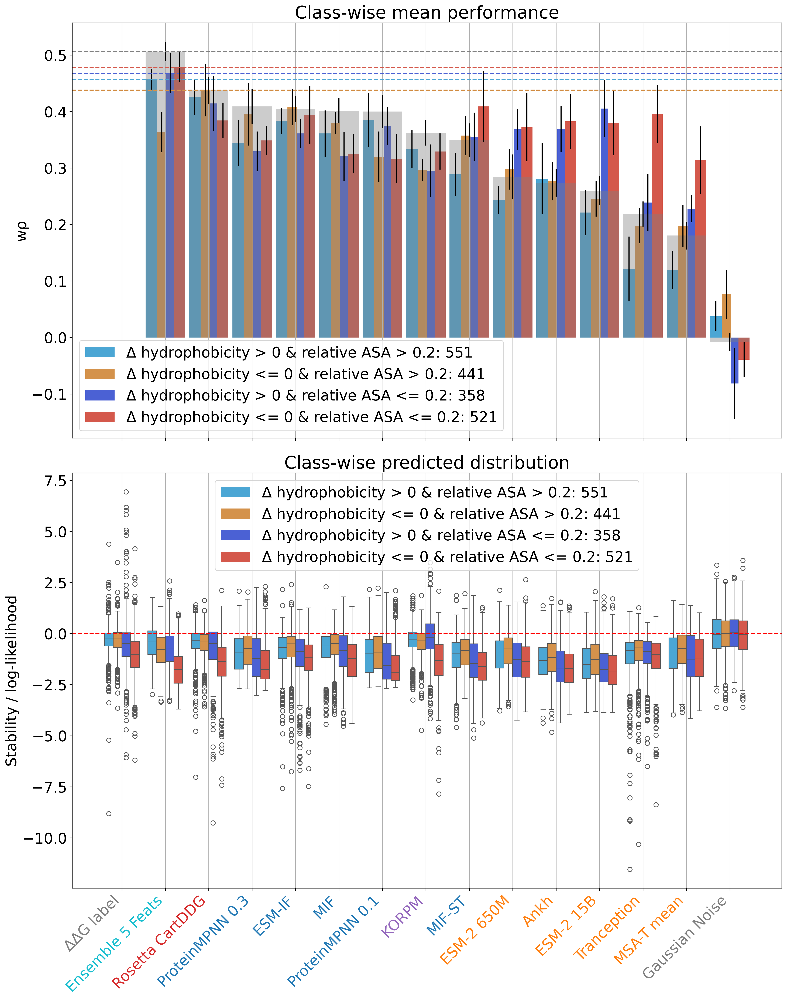

In [24]:
current_feats = ['delta_kdh', 'rel_ASA', 'ddG']
db_fig = db_complete[[c for c in db_complete if '_dir' in c or c in current_feats or c == 'cluster']]
l1 = len(db_fig)
db_fig = db_fig.fillna(0)
#db_fig = db_fig.drop(['delta_kdh_dir', 'rel_ASA_dir'], axis=1)
db_fig = db_fig.rename({'delta_kdh_dir': 'delta_kdh', 'rel_ASA_dir': 'rel_ASA'}, axis=1)
d = analysis_utils.compare_performance(
                        db_fig,
                        split_col = 'delta_kdh', 
                        split_col_2 = 'rel_ASA', 
                        threshold_1 = 0, 
                        threshold_2 = 0.2, 
                        measurement = 'ddG',
                        statistic = 'spearman',
                        statistic_2 = 'weighted_spearman',
                        n_bootstraps=5,
                        count_muts = True,
                        subset=subset,
                        grouper='cluster'
                        )
# < 10 seconds

### Generating the pairwise ensembles used in the model complementarity section

In [ ]:
zs_feats = ['rel_ASA', 'delta_kdh', 'delta_vol', 'delta_chg']
models = original_pred_cols_reduced + [c + '_dir' for c in zs_feats]
models += ['mpnn_mean_dir', 'esmif_mean_dir', 'esm2_mean_dir', 'mif_mean_dir']

#db_summ = db_preds.join(db_ddg).join(db_cluster)
db_summ = db_class
db_summ['ddG_dir'] = db_summ['ddG']
db_summ['random_dir'] = np.random.normal(loc=0, size=len(db_summ))

dfm = db_summ.join(db_feats_2[zs_feats].drop_duplicates(), how='left')
#dfm['code'] = dfm.reset_index('uid2').index.str[:4]
ren = dict(zip(zs_feats, [f+'_dir' for f in zs_feats]))
dfm = dfm.rename(ren, axis=1)
dfr = db_runtimes.copy(deep=True).reset_index(level=0, drop=True)#.drop('uid', axis=1)
dfr['code'] = dfr.index.str[:4]
dfr[['runtime_' + r for r in ['rel_ASA_dir', 'delta_kdh_dir', 'delta_vol_dir', 'delta_chg_dir']]] = 0

weights = [1, 0.5, 0.2] #, -0.2] # could include -0.2 to allow for subtracting models
weights2 = [] # fill in weights to test 3-model ensembles
#weights2 = [0.8, 0.3]

all_cols = []

tmp_preds = []
tmp_runtimes = []
for model1 in models:
    for model2 in models:
        if model1 != model2:
            for weight in weights:
                tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight, name=f'{model1} + {model2} * {weight}'))
                #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model1].max() * weight, name=f'{model1} + {model2} * {weight}'))
                all_cols.append(f'{model1} + {model2} * {weight}')
                tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2], name=f'runtime_'+all_cols[-1]))
                for model3 in models:
                    if model3 != model2:
                    #if (model1.split('_')[0] != model3.split('_')[0]) and (model2.split('_')[0] != model3.split('_')[0]):
                        for weight2 in weights2:
                            tmp_preds.append(pd.Series(dfm[model1]/dfm[model1].std() + dfm[model2]/dfm[model2].std() * weight + dfm[model3]/dfm[model3].std() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            #tmp_preds.append(pd.Series((dfm[model1]-dfm[model1].min())/dfm[model1].max() + (dfm[model2]-dfm[model2].min())/dfm[model2].max() * weight + (dfm[model3]-dfm[model3].min())/dfm[model3].max() * weight2, name=f'{model1} + {model2} * {weight} + {model3} * {weight2}'))
                            all_cols.append(f'{model1} + {model2} * {weight} + {model3} * {weight2}')
                            #tmp_runtimes.append(pd.Series(dfr['runtime_'+model1] + dfr['runtime_'+model2] + dfr['runtime_'+model3], name='runtime_'+all_cols[-1]))

print('concatenating')
dfm = pd.concat([dfm] + tmp_preds, axis=1)
dfr = pd.concat([dfr] + tmp_runtimes, axis=1)
print('joining...')
dfm = dfm.join(dfr.drop('code', axis=1))

# < 10 seconds

concatenating
joining...


### Function to retrieve all the pairwise predictions (precalculated for this demo)

In [ ]:
def get_summary_df(db_complete, cols=None, class_stats=(), saveloc='../data/pairwise/q3421_pairwise.csv', overwrite=False):

    if not overwrite:
        assert not os.path.exists(saveloc)
    if cols is None:
        cols = db_complete.columns

    df_summ = analysis_utils.compute_stats(db_complete[cols], stats=class_stats, measurements=['ddG'], grouper='cluster').reset_index().set_index(['measurement', 'model'])
    df_summ = df_summ.reset_index().rename({'index': 'model'}, axis=1)
    df_summ = df_summ.set_index(['measurement', 'model_type', 'model', 'class'])

    df_summ.to_csv(saveloc)
    return df_summ

#d1 = get_summary_df(dfm, saveloc=os.path.join(path, 'data', 'ensemble_q3421_2_models_3_weights_x3.csv'), overwrite=True)

### Pairwise statistics for all model combinations

In [ ]:
# compute all statistics on the combined set (already done, takes ~12 hours)
d1 = pd.read_csv(os.path.join(path, 'data', 'pairwise', 'pairwise_q3421_combinations_3_weights.csv')).set_index(['measurement', 'model_type', 'model', 'class'])
d1.xs('ddG').sort_values('aumsc', ascending=False).iloc[:20, 13:]

auroc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.751689   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.761829   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.749615   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.783180   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.751038   
structural  mpnn_rosetta_dir                               NaN    0.783273   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.784014   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.716473   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.755111   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.778275   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.778275   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.767802   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.791328   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.746402   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.764681   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.766306   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.766306   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.765972   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.776990   

                                                                     auprc  \
model_type  model                                          class             
NaN         ddG_dir                                        NaN    1.000000   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN    0.482721   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN    0.500235   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN    0.474306   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN    0.529519   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     NaN    0.482722   
structural  mpnn_rosetta_dir                               NaN    0.528968   
            cartesian_ddg_dir + mpnn_mean_dir * 0.5        NaN    0.532751   
            esmif_multimer_dir + delta_vol_dir * 0.2       NaN    0.475154   
NaN         stability-oracle_dir + delta_chg_dir * 0.2     NaN    0.492798   
structural  cartesian_ddg_dir + mpnn_mean_dir * 1          NaN    0.532617   
            mpnn_mean_dir + cartesian_ddg_dir * 1          NaN    0.532617   
            cartesian_ddg_dir + esmif_multimer_dir * 0.5   NaN    0.503470   
biophysical cartesian_ddg_dir + stability-oracle_dir * 0.5 NaN    0.522532   
NaN         stability-oracle_dir + delta_vol_dir * 0.5     NaN    0.473575   
structural  cartesian_ddg_dir + mif_mean_dir * 0.5         NaN    0.503441   
            cartesian_ddg_dir + mif_dir * 1                NaN    0.506585   
            mif_dir + cartesian_ddg_dir * 1                NaN    0.506585   
            cartesian_ddg_dir + esmif_mean_dir * 0.5       NaN    0.500644   
            mpnn_10_00_dir + cartesian_ddg_dir * 1         NaN    0.526972   

                                                                  0.0_n_stable  \
model_type  model                                          class                 
NaN         ddG_dir                                        NaN           631.0   
            stability-oracle_dir + rel_ASA_dir * 0.2       NaN           623.0   
            stability-oracle_dir + delta_vol_dir * 0.2     NaN           626.0   
biophysical cartesian_ddg_dir + rel_ASA_dir * 0.2          NaN           624.0   
structural  cartesian_ddg_dir + mpnn_20_00_dir * 0.5       NaN           761.0   
NaN         stability-oracle_dir + delta_kdh_dir * 0.2     Na

### Supplementary Figure 7

3421


  0%|          | 0/5 [00:00<?, ?it/s]

0.09391627787014534
['Stability Oracle', 'Rosetta CartDDG', 'ProteinMPNN 0.2', 'MIF', 'ESM-IF', 'KORPM', 'MIF-ST', 'MutComputeX', 'Ankh', 'MSA-T mean', 'Tranception', 'ESM-2 3B', 'ESM-1V mean']


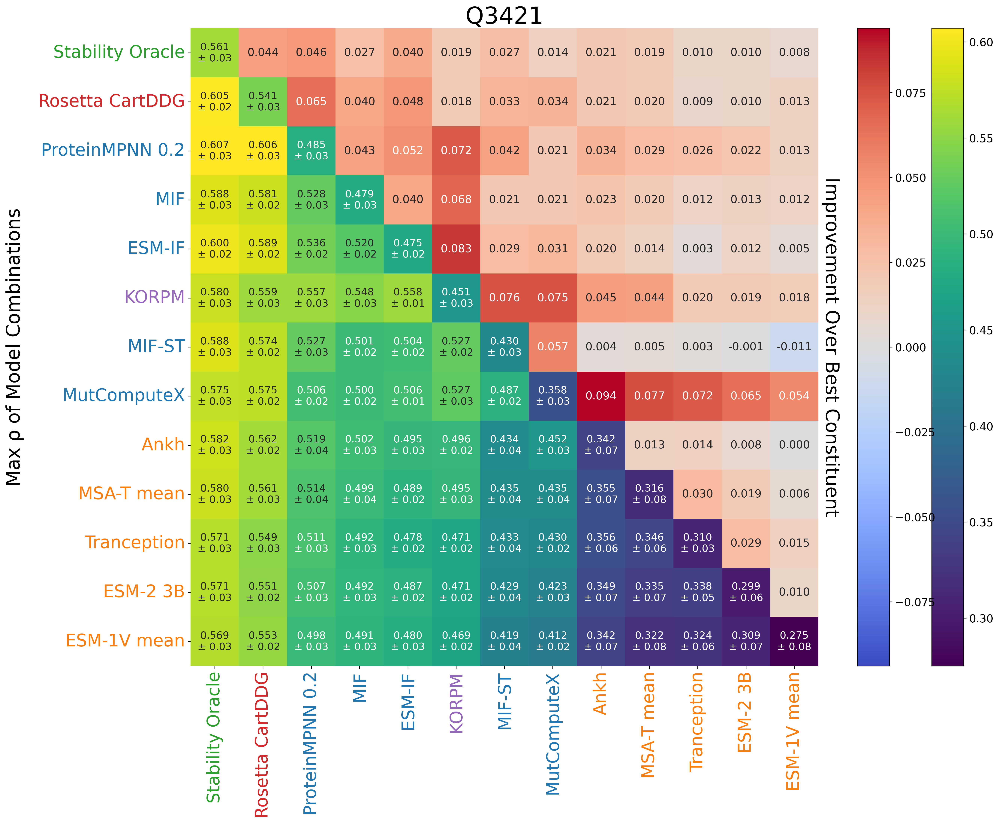

,model1,weight1,model2,weight2,mean_spearman,p_value
rank,,,,,,
1,stability-oracle_dir,1,mpnn_20_00_dir,0.5,0.607102,0.000031
2,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,0.605911,0.000046
3,cartesian_ddg_dir,1,stability-oracle_dir,1,0.60525,0.000401
4,stability-oracle_dir,1,mpnn_20_00_dir,1,0.601582,0.000463
5,stability-oracle_dir,1,esmif_multimer_dir,0.5,0.600449,0.003412
...,...,...,...,...,...,...
386,esm1v_mean_dir,1,esm2_dir,0.5,0.301928,0.817342
387,esm1v_mean_dir,1,ankh_dir,0.2,0.29832,0.018407
388,esm1v_mean_dir,1,msa_transformer_mean_dir,0.2,0.29563,0.270554


In [ ]:
subset2 = [
            'cartesian_ddg_dir',
            'esm1v_mean_dir',
            'msa_transformer_mean_dir',
            'tranception_dir',
            'ankh_dir',
            'esm2_dir',
            'esmif_multimer_dir',
            'mpnn_20_00_dir',
            'mif_dir',
            'mifst_dir',
            'korpm_dir',
            'mutcomputex_dir',
            'stability-oracle_dir'
        ]

measurement = 'ddG'
statistic = 'spearman'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2, title='Q3421')
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
stat_df

### Extra Figure (not in text) showing Net Stabilization instead

3421


  0%|          | 0/5 [00:00<?, ?it/s]

144.19
['Rosetta CartDDG', 'Tranception', 'ESM-IF', 'MIF-ST', 'ProteinMPNN 0.2', 'Ankh', 'ESM-2 3B', 'MSA-T mean', 'MIF', 'MutComputeX', 'Stability Oracle', 'ESM-1V mean', 'KORPM']


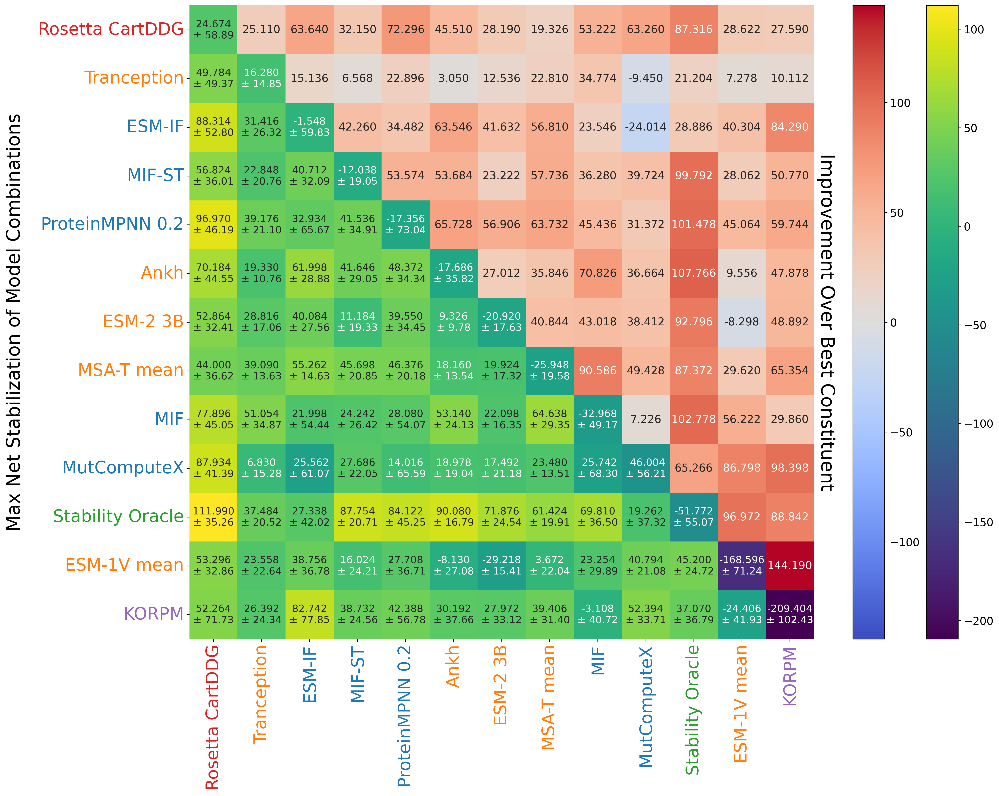

,model1,weight1,model2,weight2,mean_net_stabilization,p_value
rank,,,,,,
1,cartesian_ddg_dir,1,stability-oracle_dir,0.5,111.99,0.0028
2,stability-oracle_dir,1,cartesian_ddg_dir,1,102.278,0.017209
3,cartesian_ddg_dir,1,mpnn_20_00_dir,0.5,96.97,0.031746
4,cartesian_ddg_dir,1,mpnn_20_00_dir,0.2,91.388,0.028566
5,stability-oracle_dir,1,ankh_dir,0.2,90.08,0.001386
...,...,...,...,...,...,...
386,korpm_dir,1,stability-oracle_dir,0.2,-78.856,0.566594
387,korpm_dir,1,tranception_dir,0.2,-87.286,0.041322
388,korpm_dir,1,esm2_dir,0.2,-89.992,0.014074


In [ ]:
measurement = 'ddG'
statistic = 'net_stabilization'
upper = 'delta'

d3 = d1.copy(deep=True)
d3 = d3.reset_index()
d3 = d3.set_index(['measurement', 'model_type', 'model', 'class'])
d3 = d3.drop([c for c in d3.columns if 'pos_' in c], axis=1)

stat_df, delta_df = analysis_utils.model_combinations_heatmap(d3, dfm.fillna(0), db_ddg, statistic, measurement, n_bootstraps=5, upper=upper, subset=subset2)
stat_df = stat_df.sort_values(f'mean_{statistic}', ascending=False).drop_duplicates(subset=['weight1', 'weight2', f'mean_{statistic}'])
stat_df['standardized_pair'] = stat_df.apply(lambda x: '_'.join(sorted([x['model1'] + str(x['weight1']), x['model2'] + str(x['weight2'])])), axis=1)
stat_df = stat_df.drop_duplicates(subset='standardized_pair')
stat_df = stat_df.drop(columns='standardized_pair').reset_index(drop=True).reset_index()
stat_df = stat_df.rename({'index': 'rank'}, axis=1)
stat_df['rank'] += 1
stat_df = stat_df.set_index('rank')
#stat_df.loc[stat_df['runtime_gpu']<0, 'runtime_gpu'] = np.nan
stat_df

# ~ 10 seconds

### Supplementary Figure 8

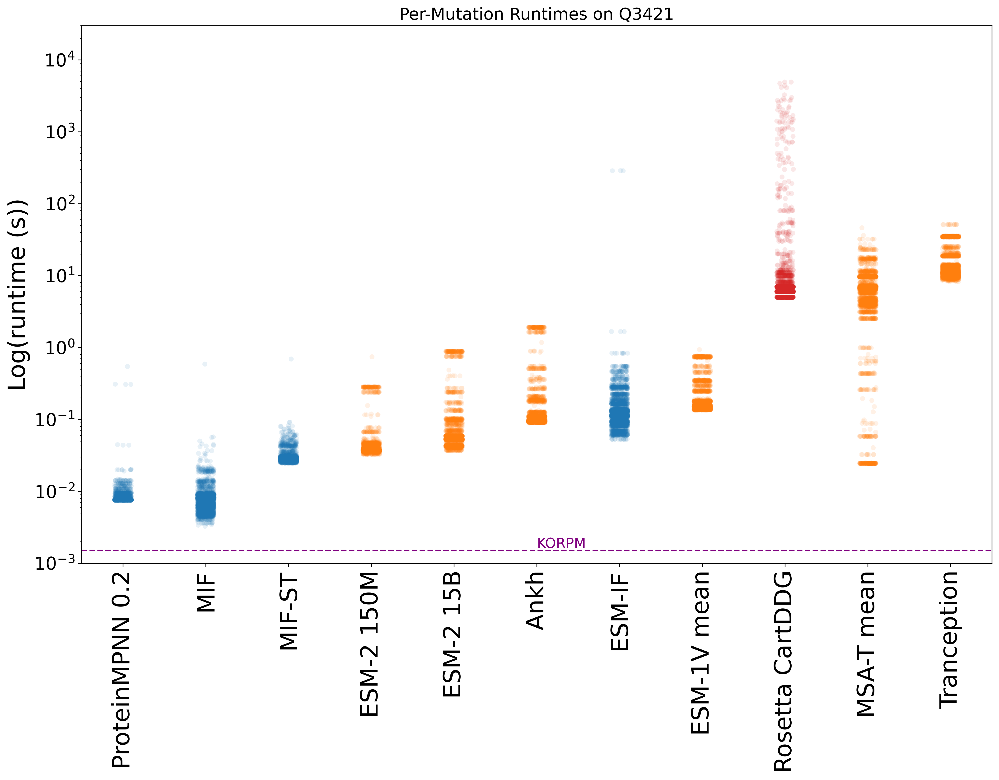

In [ ]:
int_runtimes = db_runtimes.dropna(axis=1, how='all')#.groupby('code').mean()#.sum() #uncomment to get mean per protein
int_runtimes = int_runtimes[[
                             'runtime_esmif_multimer_dir',
                             'runtime_mif_dir',
                             'runtime_mifst_dir',
                             'runtime_mpnn_20_00_dir',
                             'runtime_tranception_dir',
                             'runtime_msa_transformer_mean_dir',
                             'runtime_esm1v_mean_dir',
                             'runtime_esm2_150M_dir',
                             'runtime_cartesian_ddg_dir',
                             'runtime_ankh_dir',
                             'runtime_esm2_15B_half_dir'
                            ]]

int_runtimes.columns = [c[8:-4] for c in int_runtimes.columns]
#int_runtimes.columns = int_runtimes.columns.map(analysis_utils.remap_names)
total_runtimes = int_runtimes.melt().sort_values('value')#.sum(axis=0)

### determine order for displaying runtimes
# Calculate the grouped median
grouped_median = total_runtimes.groupby('variable')['value'].median()
# Create a temporary column 'group_median' with the grouped medians mapped to each row
total_runtimes['group_median'] = total_runtimes['variable'].map(grouped_median)
# Sort the DataFrame first by 'group_median' and then by 'variable'
df_sorted = total_runtimes.sort_values(['group_median', 'variable'], ascending=True)
# Drop the temporary column 'group_median'
total_runtimes = df_sorted.drop(columns=['group_median'])

total_runtimes['category'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_category(x))
total_runtimes['color'] = total_runtimes['variable'].apply(lambda x: analysis_utils.determine_base_color(x))

custom_palette = [
    (0.12156863, 0.46666667, 0.70588235),  # blue
    (1.0, 0.49803922, 0.05490196),  # orange
    (0.8392156862745098, 0.153, 0.153)  # red
]

# Set the custom palette
sns.set_palette(custom_palette)

fig, ax = plt.subplots(figsize=(1.5*total_runtimes['variable'].nunique(), 10), dpi=300)  # adjust the size here
ax = sns.stripplot(data=total_runtimes, x='variable', y='value', hue='color', alpha=0.1, legend=False)

plt.axhline(y=0.0015, color='purple', linestyle='--', label='KORPM')
plt.text(5, 0.0015, 'KORPM', color='purple', verticalalignment='bottom')

remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
ax.set_xticklabels(remapped_x)
ax.set_yticklabels(remapped_x[::-1])
plt.title('Per-Mutation Runtimes on Q3421')
plt.yscale('log')
plt.ylim(10e-4, 30000)
plt.xticks(rotation=90, fontsize=24)
plt.xlabel('')
plt.yticks(fontsize=18)
plt.ylabel('Log(runtime (s))', fontsize=24)
plt.show()

### Following cells relate to preprocessing required for Supplementary Figure 2

In [ ]:
neff = pd.read_csv(os.path.join(path, 'data', 'features', 'neff_s669.csv'), header=None).set_index(0) # todo / fix
neff.index.name = 'code'
neff.columns = ['neff']

s669_feats = pd.read_csv(os.path.join(path, 'data', 'features', 's669_local_mapped_feats.csv'))
s669_feats['uid'] = s669_feats['code'] + '_' + s669_feats['position_orig'].astype(str) + s669_feats['mutation']
s669_feats['uid2'] = s669_feats['code'] + '_' + s669_feats['position'].astype(str) + s669_feats['mutation']

s669_feats = s669_feats.set_index('uid')
s669_feats = s669_feats[['uid2', 'wild_type', 'on_interface', 'entropy', 'conservation', 'column_completeness', 'completeness_score', 'n_seqs', 'structure_length', 'multimer', 'SS',
                        'features', 'hbonds', 'saltbrs', 'b_factor', 'kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'rel_ASA', 'is_nmr', 'pH', 'resolution',
                        'SOL_ACC_dir', 'SOL_ACC_inv']] #'residue_depth',

s669_feats['on_interface'] = s669_feats['on_interface'].astype(int)
s669_feats['features'] = s669_feats['features'].fillna("")#.apply(list)
#db_complete = db_complete.reset_index('uid').join(s669_feats.set_index('uid'))
s669_feats['delta_kdh'] = s669_feats['kdh_mut'] - s669_feats['kdh_wt']
s669_feats['delta_vol'] = s669_feats['vol_mut'] - s669_feats['vol_wt']
s669_feats['delta_chg'] = s669_feats['chg_mut'] - s669_feats['chg_wt']
s669_feats['delta_asa'] = s669_feats['SOL_ACC_inv'] - s669_feats['SOL_ACC_dir']
s669_feats['asa'] = s669_feats['SOL_ACC_dir']
s669_feats['to_proline'] = (s669_feats.index.str[-1] == 'P').astype(int)
s669_feats['to_glycine'] = (s669_feats.index.str[-1] == 'G').astype(int)
s669_feats['from_proline'] = s669_feats['wild_type'] == 'P'
s669_feats['from_glycine'] = s669_feats['wild_type'] == 'G'
s669_feats['to_alanine'] = (s669_feats.index.str[-1] == 'A').astype(int)
s669_feats['helix'] = s669_feats['SS'] == 'H'
s669_feats['bend'] = s669_feats['SS'] == 'S'
s669_feats['turn'] = s669_feats['SS'] == 'T'
s669_feats['coil'] = s669_feats['SS'] == '-'
s669_feats['strand'] = s669_feats['SS'] == 'E'
#s669_feats['xray_else_NMR'] = s669_feats['nmr_xray'].str.contains('X-RAY')
s669_feats['active_site'] = s669_feats['features'].str.contains('ACT_SITE')
s669_feats['resolution'] = s669_feats['resolution'].fillna('').apply(lambda x: analysis_utils.extract_decimal_number(x))
#s669_feats['mpnn_median_dir'] = s669_feats[['mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir']].mean(axis=1)
s669_feats = s669_feats.drop(['kdh_wt', 'kdh_mut', 'vol_wt', 'vol_mut', 'chg_wt', 'chg_mut', 'features', 'SS', 'wild_type'], axis=1)
# 'mpnn_20_021_dir', 'mpnn_20_022_dir', 'mpnn_20_019_dir', 'mpnn_10_dir', 'mpnn_30_dir', 'mpnn_30_03_dir', 'mpnn_20_02_dir',
s669_feats['code'] = s669_feats.index.str[:4]
s669_feats = s669_feats.reset_index().merge(neff['neff'].dropna(), on='code', how='left').drop('code', axis=1)#.set_index('uid')
s669_feats['neff'] = s669_feats['neff'].fillna(0)
s669_feats = s669_feats.groupby('uid').max()
s669_feats = s669_feats.reset_index().set_index(['uid', 'uid2'])

# preprocess S461 to align with S669
s461 = pd.read_csv(os.path.join(path, 'data', 'external_datasets', 'S461.csv'))
s461['uid'] = s461['PDB'] + '_' + s461['MUT_D'].str[2:]
s461 = s461.set_index('uid')
s461['ddG_I'] = -s461['ddG_D']
s461.columns = [s+'_dir' for s in s461.columns]
s461 = s461.rename({'ddG_D_dir': 'ddG', 'ddG_I_dir': 'ddG_inv'}, axis=1)

s461_feats = s669_feats.reset_index('uid2').join(s461[['ddG']], how='inner')

In [ ]:
from sklearn.preprocessing import MinMaxScaler

def compare_distributions_violin(df1, df2, shared_columns=None):
    remap_names = {'delta_chg': 'Δ charge', 'delta_vol': 'Δ volume', 'hbonds': 'wt hydrogen bonds', 
                    'multimer': 'chains in assembly', 'neff': 'n effective sequences', 'b_factor': 'beta factor',
                    'rel_ASA': 'SASA', 'delta_kdh': 'Δ hydrophobicity', 'ddG': 'ΔΔG', 'structure_length': 'n residues', 
                    'completeness_score': 'alignment completeness'}

    if shared_columns is None:
        # Identify shared columns
        shared_columns = set(df1.columns).intersection(df2.columns)
        print(shared_columns)

    # Exclude boolean columns
    shared_columns = [col for col in shared_columns if df1[col].dtype != 'bool' and df2[col].dtype != 'bool']

    # Create a combined dataframe with an extra column to indicate the source dataframe
    df1_copy = df1[shared_columns].copy()
    df1_copy['source'] = 'Q3421'

    df2_copy = df2[shared_columns].copy()
    df2_copy['source'] = 'S461'

    combined_df = pd.concat([df1_copy, df2_copy])

    # Apply Min-Max Scaling
    scaler = MinMaxScaler()
    combined_df[shared_columns] = scaler.fit_transform(combined_df[shared_columns])

    # Melt the dataframe to long format for plotting
    melted_df = combined_df.melt(id_vars='source', value_vars=shared_columns)

    # Plot a violin plot for each shared column
    plt.figure(figsize=(20, 10))
    ax = sns.violinplot(x='variable', y='value', hue='source', split=True, data=melted_df, bw=0.1, inner='quart')

    for i, col in enumerate(shared_columns):
        # Calculate medians before transformation
        median_df1 = df1[col].median()
        median_df2 = df2[col].median()

        # Normalize column
        combined_col = pd.concat([df1[[col]], df2[[col]]])
        combined_col_scaled = scaler.fit_transform(combined_col)

        # Create DataFrame for violin plot
        violin_df = pd.DataFrame({
            'Column': [i]*len(combined_col),  # replace column name with numeric value
            'Value': combined_col_scaled.flatten(),
            'Source': ['df1']*len(df1) + ['df2']*len(df2)
        })

        # Plot violin
        #sns.violinplot(x='Column', y='Value', hue='Source', data=violin_df, split=True, inner=None, ax=ax)

        # Plot median markers
        median_df1_scaled = scaler.transform([[median_df1]])[0, 0]
        median_df2_scaled = scaler.transform([[median_df2]])[0, 0]
        plt.plot([i-0.2, i], [median_df1_scaled, median_df1_scaled], color='blue', linestyle='dashed')
        plt.plot([i, i+0.2], [median_df2_scaled, median_df2_scaled], color='red', linestyle='dashed')

        # Annotate median markers
        ax.text(i-0.4, median_df1_scaled, f'{median_df1:.2f}', color='blue', va='center', fontsize=10)
        ax.text(i+0.3, median_df2_scaled, f'{median_df2:.2f}', color='red', va='center', fontsize=10)

    remapped_x = [remap_names[tick.get_text()] if tick.get_text() in remap_names.keys() else tick.get_text() for tick in ax.get_xticklabels()]
    ax.set_xticklabels(remapped_x)

    plt.title('Feature Distributions for Q3421 and S461', fontsize=30)
    plt.xticks(rotation=90, fontsize=16)
    plt.yticks(rotation=90, fontsize=16)
    plt.xlabel('Feature', fontsize=24)
    plt.ylabel('Normalized Value', fontsize=24)
    plt.show()


### Supplementary Figure 2

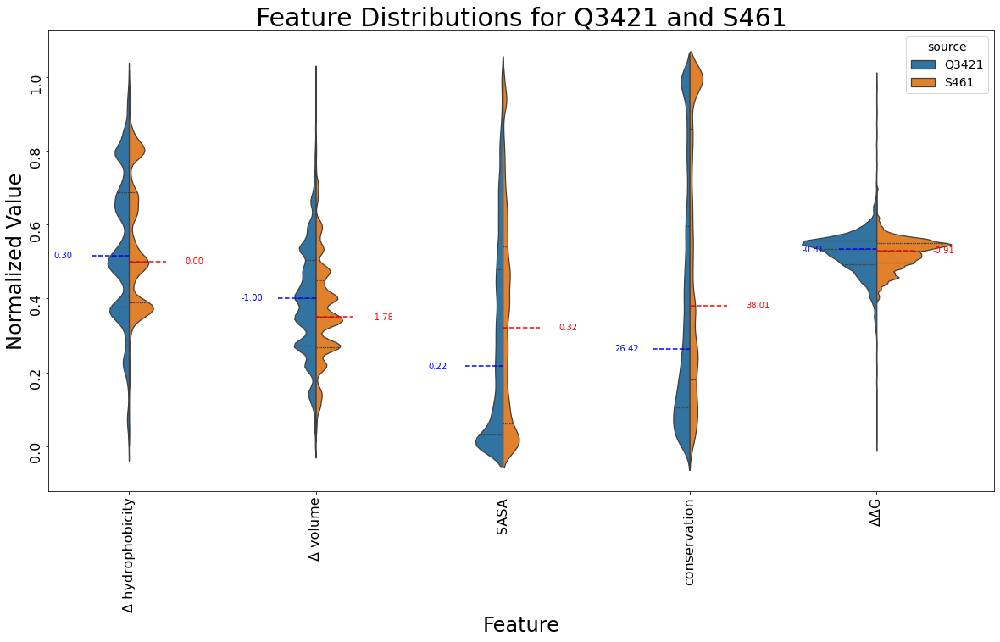

In [ ]:
compare_distributions_violin(db_feats_2.drop(['n_seqs', 'on_interface', 'column_completeness', 'saltbrs'], axis=1).join(db_ddg), s461_feats, shared_columns=['delta_kdh', 'delta_vol', 'rel_ASA', 'conservation', 'ddG'])

### Figure 5 (Methods)

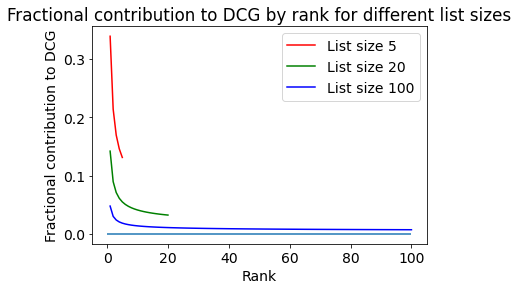

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def fractional_contributions(list_size, base=2):
    ranks = np.arange(1, list_size+1)
    discounts = 1 / np.log2(ranks + 1)  # compute the discount for each rank
    return discounts / np.sum(discounts)  # normalize to get fractional contributions

list_sizes = [5, 20, 100]
colors = ['r', 'g', 'b']

for i, list_size in enumerate(list_sizes):
    fractions = fractional_contributions(list_size)
    plt.plot(np.arange(1, list_size+1), fractions, color=colors[i], label=f'List size {list_size}')

plt.xlabel('Rank')
plt.ylabel('Fractional contribution to DCG')
plt.title('Fractional contribution to DCG by rank for different list sizes')
plt.hlines(0, 0, 100)
plt.legend()
plt.show()